In [10]:
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import h5py
import glob 
from scipy import interpolate
import json
import os
import sys
from NuRadioReco.utilities import units
from NuRadioReco.detector import detector
from NuRadioMC.utilities import fluxes
from NuRadioMC.utilities.Veff import get_Veff_Aeff, get_Veff_Aeff_array, get_index, get_Veff_water_equivalent
#from my_Veff import get_Veff_Aeff, get_Veff_Aeff_array, get_index, get_Veff_water_equivalent
from NuRadioMC.examples.Sensitivities import E2_fluxes3 as limits
from Get_hdf5_data import get_attr_data, get_shower_data, get_station_data, get_Veff_data, get_event_data, get_nur_data
from Peak_Finding import count_peak, get_noise, save_data_2_csv, read_column_csv
import numpy as np
import matplotlib.pyplot as plt
from NuRadioReco.utilities import units
import NuRadioReco.detector.detector as detector
import NuRadioReco.modules.io.eventReader
import astropy
from NuRadioReco.framework.parameters import stationParameters as stnp
import pandas as pd
from math import isclose

temp_stdout = None
# Disable
def blockPrint():
    global temp_stdout
    temp_stdout = sys.stdout
    sys.stdout = open(os.devnull, 'w')

# Restore
def enablePrint():
    global temp_stdout
    sys.stdout = temp_stdout


PATH = "/home/teikiet/Data/"
##########################################################################
S_ID = [100,2, 3, 4, 5] #station ID
C_ID = list(range(0,16)) #channel ID
##########################################################################
threshold = 5 #threshold
bin_size = 11 #bin size aka time interval x0.625 ns
sample_size = 800 #the time interval for peak detection x0.625ns
E = 18 #energy
num =  1e4 #number of particles
detectordescription = "detector/ara2.json" #detector 
##########################################################################
#Nur path:
inputfilename1 = PATH + f"sims_monopoles_ara2_n1.000e04_3_18to20/Nur/1.000e{E}_3"
inputfilename2 = PATH + f"sims_neutrinos_ara2_n1.000e04_3_18to20/Nur/sim_1.000e{E}.nur"
inputfilename3 = PATH + f"sims_noise_ara2_n1.000e04_1_18to18/Nur/sim_1.000e18_part02.nur"
##########################################################################
#Hdf5 path:
path1 = PATH + f'sims_monopoles_ara2_n1.000e04_3_18to20/Hdf5/1.000e{E}'
path2 = PATH + f'sims_neutrinos_ara2_n1.000e04_3_18to20/Hdf5/sim_1.000e{E}.hdf5'
path3 = PATH + f'sims_noise_ara2_n1.000e04_1_18to18/Hdf5/'
#get_attr_data(path2)
##########################################################################
#Save data to csv file:
data1 = PATH + f'Peak_data/Data_monopoles_ara2_n1.000e03_1e{E}.csv'
data2 = PATH + f'Peak_data/Data_neutrinos_ara2_n1.000e03_1e{E}.csv'
data3 = PATH + f'Peak_data/Data_noise_ara2.csv'
##########################################################################
#Find peak and save data:
#save_data_2_csv(data1, inputfilename1, detectordescription, S_ID, C_ID)  
#save_data_2_csv(data2 ,inputfilename2, detectordescription, S_ID, C_ID)  
#save_data_2_csv(data3 ,inputfilename3, detectordescription, S_ID, C_ID)

In [2]:
#Get the triggered shower data:
# Read the CSV file
data_frame1 = pd.read_csv(data1)
event_id1 = np.array(data_frame1["event"])
num_of_events_1 = event_id1[-1]

####################
e_id1 = list(range(1, int(event_id1[-1]+1)))
####################
s_ID1 = S_ID
####################
c_ID1 = C_ID

# Access a specific column by column name using indexing operator 
trace1 = np.array(data_frame1.query(f"station == {s_ID1} and channel == {c_ID1} and event == {e_id1}")['Traces']) 
times1 = np.array(data_frame1.query(f"station == {s_ID1} and channel == {c_ID1} and event == {e_id1}")['Times'])

total_event1 = event_id1[-1]
print(len(trace1), total_event1)

amp_time1, max_amp1, distance1, shower_id1 = get_station_data(path1, s_ID1, c_ID1)


101248 4.0
Finish!


(array([16992., 11168.,  3328.,  6256., 12128.,  4016., 17920., 13424.,
         8304.,  7744.]),
 array([1.9000000e+02, 1.4556060e+05, 2.9093120e+05, 4.3630180e+05,
        5.8167240e+05, 7.2704300e+05, 8.7241360e+05, 1.0177842e+06,
        1.1631548e+06, 1.3085254e+06, 1.4538960e+06]),
 <BarContainer object of 10 artists>)

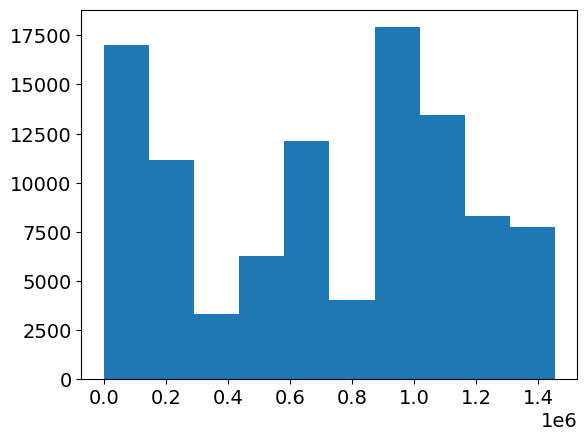

In [3]:
plt.hist(shower_id1)

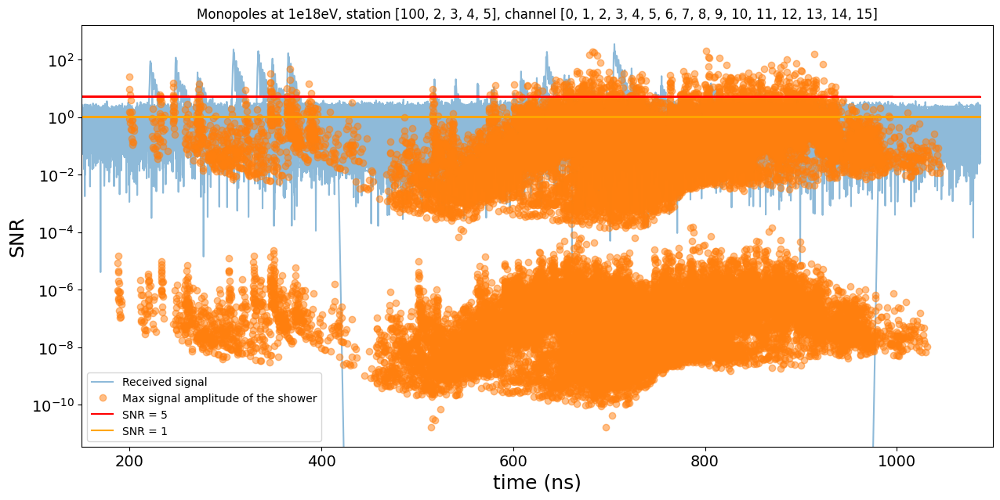

In [4]:
#Monopoles signal plot:
dt = 0.625#ns
plt.figure(figsize=(15, 7))
noise1=1.0661514487245143e-05
#plt.plot(t_bin1*dt, v_bin1/noise1, "-", label = "Received signal")
plt.plot(times1*dt, abs(trace1)/noise1,"-" ,alpha = 0.5, label = "Received signal")
plt.plot(amp_time1*dt, max_amp1/noise1, "o",alpha = 0.5, label = "Max signal amplitude of the shower")

plt.plot(times1*dt, threshold+times1*0, "-", label = f"SNR = {threshold}", color = "red")
plt.plot(times1*dt, 1+times1*0, "-", label = "SNR = 1", color = "orange")
#plt.xlim(min(t_bin1*dt), max(t_bin1*dt))
#plt.ylim(5e-1, max( V_peak1/noise1)*1.5)
plt.title(f"Monopoles at 1e{E}eV, station {s_ID1}, channel {c_ID1}")
plt.legend()
plt.ylabel("SNR")
plt.xlabel("time (ns)")
plt.yscale("log")
#plt.ylim(1e-9, 1e-1)
plt.xlim(150, 1100)
plt.show()

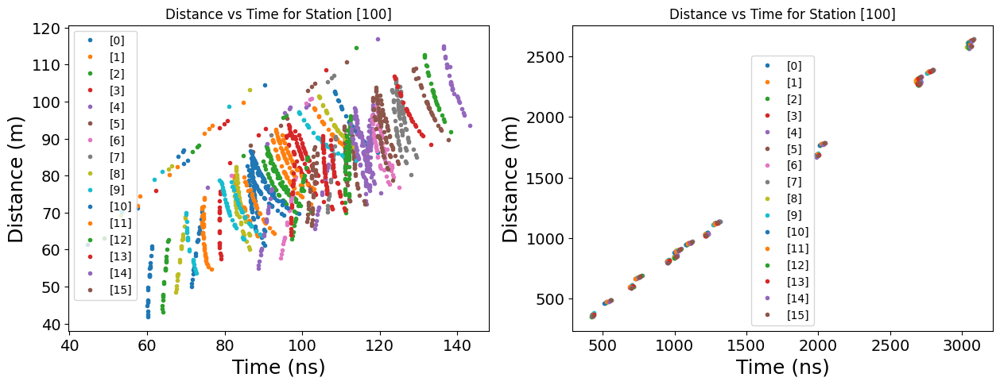

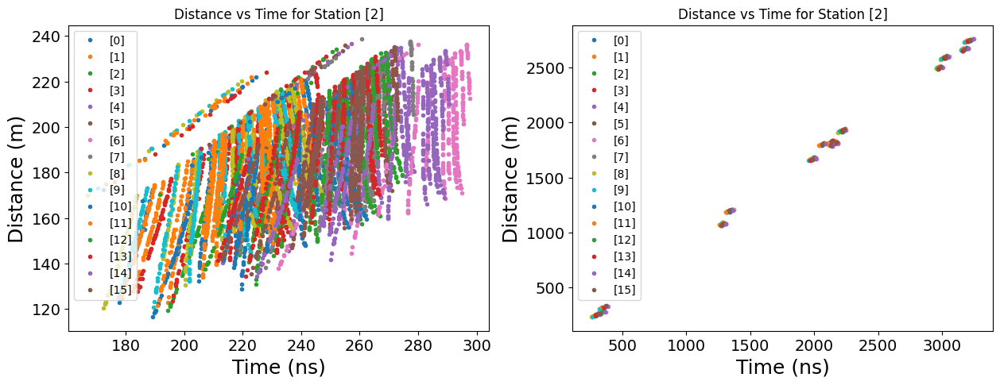

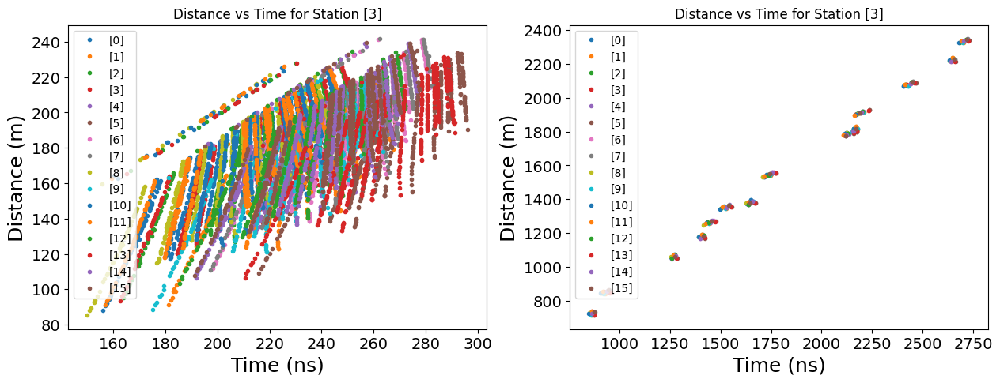

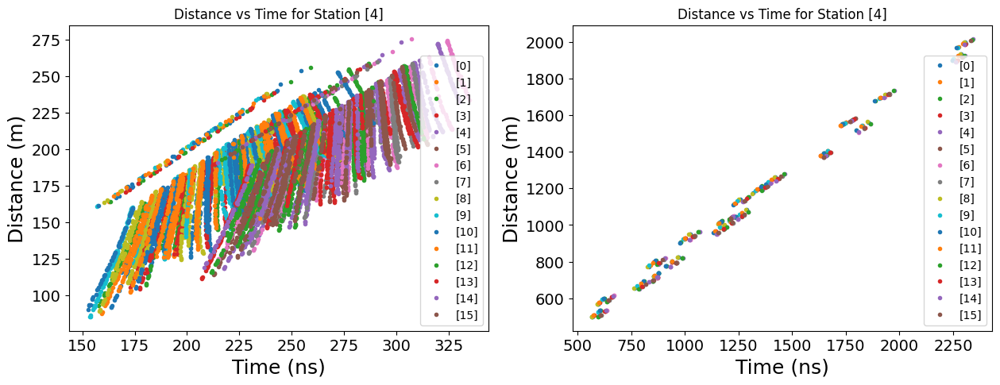

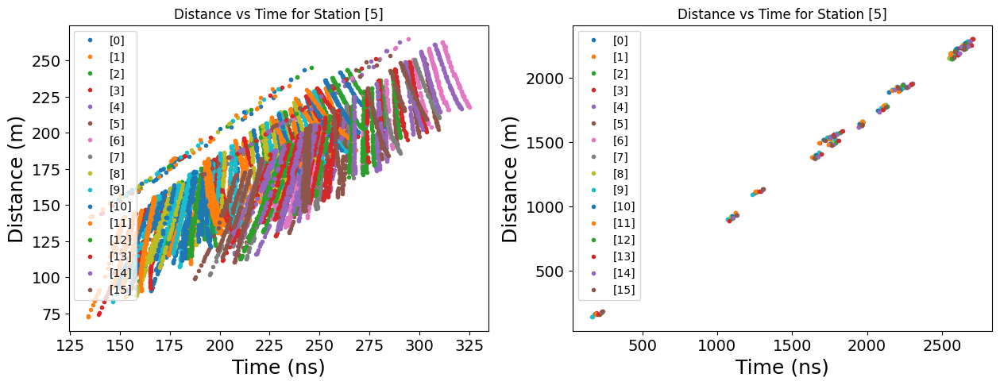

In [11]:
#make a side by side plot:
C_ID = list(range(0,16))
for s_i in S_ID:
    s_i = [s_i]
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    for c_i in C_ID:
        c_i = [c_i]
        blockPrint()
        amp_time1, max_amp1, distance1, shower_id1 = get_station_data(path1, s_i, c_i)
        amp_time2, max_amp2, distance2, shower_id2 = get_station_data(path2, s_i, c_i)
        enablePrint()
        ax1.plot(amp_time1*0.2, distance1, '.' ,label = '{}'.format(c_i))
        ax2.plot(amp_time2*0.2, distance2, '.' ,label = '{}'.format(c_i))
        
    ax1.set_xlabel('Time (ns)')
    ax1.set_ylabel('Distance (m)')
    ax1.set_title('Distance vs Time for Station ' + str(s_i))
    ax1.legend()
    ax2.set_xlabel('Time (ns)')
    ax2.set_ylabel('Distance (m)')
    ax2.set_title('Distance vs Time for Station ' + str(s_i))
    ax2.legend()
    plt.show()


In [ ]:

#channel location:
C_z = -200
#Sation location:
S_5 = [-800.2219, -2522.616, C_z]
S_4 = [134.7216, 2701.534, C_z]
S_3 = [-840.486, 933.7548, C_z]
S_2 = [158.5874, -799.5514, C_z]
S_100 = [-800.2219, -2522.616, C_z]

S = S_5
##########################################################
S_ID = [5]
c_ID = [15]#list(range(0,16))
shower_id, shower_energies, xx, yy, zz, shower_type = get_shower_data(output_file1)
amp_time1, max_amp1, distance1, shower_id1 = get_station_data(output_file1, S_ID, c_ID)
amp_time1, max_amp1, distance1, shower_id1 = list(zip(*sorted(zip(amp_time1, max_amp1, distance1, shower_id1))))
t1 = []
x1 = []
y1 = []
z1 = []
c1 = []
step = 10

for i in range(0, len(shower_id1), step):
    for j in range(len(shower_id)):
        if shower_id1[i] == shower_id[j] and amp_time1[i] > 0:
            t1.append(amp_time1[i])
            x1.append([S[0]] +  list(xx[j:j+step]))
            y1.append([S[1]] +  list(yy[j:j+step]))
            z1.append([S[2]] +  list(zz[j:j+step]))
            c1.append([-1e10] + list(shower_energies[j:j+step]))
print(len(x1), len(amp_time1), len(shower_id1))

NameError: name 'get_shower_data' is not defined

In [ ]:
import plotly
import plotly #load plotly for plotting
import plotly 
from plotly import tools
from plotly.graph_objs import * #all the types of plots that we will plot here
import numpy as np
import plotly.graph_objects as go


t = np.array(t1)*0.2
x = x1
y = y1
z = z1
c = c1

trace1 = Scatter3d(
    x = x,
    y = y,
    z = z,
    mode='markers',
    marker=dict(
        size=5,
        color=c1,  # set color to an array/list of desired values
        colorscale='Cividis_r',   # choose a colorscale
        opacity=1, colorbar=dict(thickness=20)
    )
)


data = [trace1]
axis = dict(showbackground=True, 
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="rgb(255, 255, 255)",      
            zerolinecolor="rgb(255, 255, 255)",  
            )
frames = [dict(data= [dict(type='scatter3d',
                           x = x[k],
                           y = y[k],
                           z = z[k])], # update only z; x, y are the same as in basic data
               traces= [0],
               name='frame{}'.format(k)       
            ) for k  in  range(t.shape[0])]
            
sliders = [dict(steps= [dict(method= 'animate',#Sets the Plotly method to be called when the
                                                #slider value is changed.
                           args= [[ 'frame{}'.format(k) ],#Sets the arguments values to be passed to 
                                                              #the Plotly method set in method on slide
                                  dict(mode= 'immediate',
                                  frame= dict( duration=500, redraw= False ),
                                           transition=dict( duration= 0)
                                          )
                                    ],
                            label='{:.2f}'.format(t[k])
                             ) for k in range(t.shape[0])], 
                transition= dict(duration= 0 ),
                x=0,#slider starting position  
                y=0, 
                currentvalue=dict(font=dict(size=12), 
                                  prefix='Time: ', 
                                  visible=True, 
                                  xanchor= 'center'
                                 ),  
                len=1.0)#slider length)
           ]
layout = dict(title=f'shower visualization for station {S_ID}, channel {c_ID}',
              autosize=False,
              width=1200,
              height=600,
              showlegend=False,
              scene=dict(camera = dict(eye=dict(x=1.25, y=0.9, z=1.1)),
              aspectratio=dict(x=1, y=1, z=1.5),
              #xaxis=dict(axis),
              #yaxis=dict(axis), 
              xaxis_range=[min(xx)-100, max(xx)+100],
              yaxis_range=[min(yy)-100, max(yy)+100],
              zaxis_range=[min(zz)-100, max(zz)+1])
,   
              updatemenus=[dict(type='buttons', showactive=False,
                                y=0,
                                x=1.15,
                                xanchor='right',
                                yanchor='top',
                                pad=dict(t=0, r=10),
                                buttons=[dict(label='Play',
                                              method='animate',
                                              args=[None, 
                                                    dict(frame=dict(duration=20, 
                                                                    redraw=True),
                                                         transition=dict(duration=5),
                                                         fromcurrent=True,
                                                         mode='immediate'
                                                        )
                                                   ]
                                             )
                                        ]
                               )
                          ],
              sliders=sliders
    
)
fig = go.Figure(data=data, layout=layout, frames=frames)
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 0
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 0
fig.update_geos(projection_type="equirectangular", visible=True, resolution=50)
fig.show()

In [ ]:
r17 #ns 170m


17

In [ ]:
import plotly #load plotly for plotting
import plotly 
from plotly import tools
from plotly.graph_objs import * #all the types of plots that we will plot here
plotly.offline.init_notebook_mode() # run at the start of every ipython notebook


trace1 = Scatter3d(
    x = xx,
    y = yy,
    z = zz,
    mode='markers',
    marker=dict(
        size=5,
        color=shower_energies,  # set color to an array/list of desired values
        colorscale='Plasma',   # choose a colorscale
        opacity=0.5
    )
)


data = [trace1]
layout = Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='3d-scatter-colorscale')

In [ ]:
shower_id, shower_energies, xx, yy, zz, shower_type = get_shower_data(output_file2)
amp_time2, max_amp2, distance2, shower_id2 = get_station_data(output_file2, S_ID, c_ID)
print(len(shower_energies))
#Matching xx with travel time by shower_id:
x2 = []
y2 = []
z2 = []
for i in range(len(shower_id2)):
    for j in range(len(shower_id)):
        if shower_id2[i] == shower_id[j]:
            x2.append([xx[j]])
            y2.append([yy[j]])
            z2.append([zz[j]])
print(len(x2), len(amp_time2), len(shower_id2))


Finish!
32
7 7 7


In [ ]:
import plotly #load plotly for plotting
import plotly 
from plotly import tools
from plotly.graph_objs import * #all the types of plots that we will plot here
plotly.offline.init_notebook_mode() # run at the start of every ipython notebook


trace1 = Scatter3d(
    x = xx,
    y = yy,
    z = zz,
    mode='markers',
    marker=dict(
        size=5,
        color=shower_energies,  # set color to an array/list of desired values
        colorscale='Plasma',   # choose a colorscale
        opacity=0.5
    )
)


data = [trace1]
layout = Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='3d-scatter-colorscale')


In [ ]:
import plotly
import plotly #load plotly for plotting
import plotly 
from plotly import tools
from plotly.graph_objs import * #all the types of plots that we will plot here
plotly.offline.init_notebook_mode()
import numpy as np
import plotly.graph_objects as go


t = amp_time2*0.2
x = x2
y = y2
z = z2

trace1 = Scatter3d(
    x = x,
    y = y,
    z = z,
    mode='markers',
    marker=dict(
        size=10,
        color=shower_energies,  # set color to an array/list of desired values
        colorscale='Plasma',   # choose a colorscale
        opacity=1
    )
)


data = [trace1]
axis = dict(showbackground=True, 
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="rgb(255, 255, 255)",      
            zerolinecolor="rgb(255, 255, 255)",  
            )
frames = [dict(data= [dict(type='scatter3d',
                           x = x[k],
                           y = y[k],
                           z=z[k])], # update only z; x, y are the same as in basic data
               traces= [0],
               name='frame{}'.format(k)       
            ) for k  in  range(t.shape[0])]
            
sliders = [dict(steps= [dict(method= 'animate',#Sets the Plotly method to be called when the
                                                #slider value is changed.
                           args= [[ 'frame{}'.format(k) ],#Sets the arguments values to be passed to 
                                                              #the Plotly method set in method on slide
                                  dict(mode= 'immediate',
                                  frame= dict( duration=0, redraw= False ),
                                           transition=dict( duration= 0)
                                          )
                                    ],
                            label='{:.2f}'.format(t[k])
                             ) for k in range(t.shape[0])], 
                transition= dict(duration= 50 ),
                x=0,#slider starting position  
                y=0, 
                currentvalue=dict(font=dict(size=12), 
                                  prefix='Time: ', 
                                  visible=True, 
                                  xanchor= 'center'
                                 ),  
                len=1.0)#slider length)
           ]
layout = dict(title='Animating a 2d wave',
              autosize=False,
              width=600,
              height=600,
              showlegend=False,
              scene=dict(camera = dict(eye=dict(x=1.25, y=0.9, z=1.1)),
              aspectratio=dict(x=1, y=1, z=0.5),
              #xaxis=dict(axis),
              #yaxis=dict(axis), 
              xaxis_range=[-3000, 3000],
              yaxis_range=[-3000, 3000],
              zaxis_range=[-2000, 0])
,
               
              updatemenus=[dict(type='buttons', showactive=False,
                                y=0,
                                x=1.15,
                                xanchor='right',
                                yanchor='top',
                                pad=dict(t=0, r=10),
                                buttons=[dict(label='Play',
                                              method='animate',
                                              args=[None, 
                                                    dict(frame=dict(duration=20, 
                                                                    redraw=True),
                                                         transition=dict(duration=0),
                                                         fromcurrent=True,
                                                         mode='immediate'
                                                        )
                                                   ]
                                             )
                                        ]
                               )
                          ],
              sliders=sliders
    
)

fig = go.Figure(data=data, layout=layout, frames=frames)
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 0.000001
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 0.0000001
fig.update_geos(projection_type="equirectangular", visible=True, resolution=50)
fig.show()

256